# A Cat/Dog classifier

Here we will try to train a cat/dog classifiers with images of higher-resolution than we got from the CIFA10 dataset.

In [28]:
# numpy and plotting
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# keras
import keras
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Activation, Flatten, BatchNormalization
from keras.layers import Conv2D, MaxPooling2D
from keras.preprocessing.image import ImageDataGenerator

## Data
First we load some prepared images of cats and dogs and split the data into training and test sets and make sure we have equal numbers of cats and dogs.

4561  images in total
2168  cats,  2393  dogs; using  2168  of each


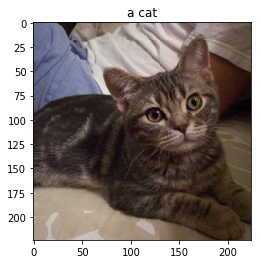

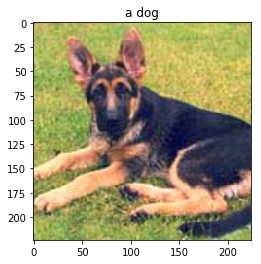

In [29]:
DATAFILE="../../../data/catsDogsImageNet.npz"
with np.load(DATAFILE) as datafile:
    ncats = np.where(datafile["label"]==0)[0].size
    ndogs = np.where(datafile["label"]==1)[0].size
    neach = min(ncats, ndogs)
    print(datafile["data"].shape[0], " images in total")
    print(ncats, " cats, ", ndogs, " dogs; using ", neach, " of each")
    data = np.concatenate((datafile['data'][0:neach], datafile['data'][ncats:ncats+neach]))
    data = data /255.
    dataAverage = np.average(data, axis=0)
    #data -= dataAverage
    labels = np.concatenate((np.zeros(neach), np.ones(neach)))
    
    plt.imshow(data[0])
    plt.title("a cat")
    plt.show()
    plt.imshow(data[ncats])
    plt.title("a dog")
    plt.show()
    
selection = np.random.permutation(data.shape[0])
split = int(len(selection)*.7)
x_train = data[selection[:split]]
y_train = labels[selection[:split]]
x_test = data[selection[split:]]
y_test = labels[selection[split:]]
del labels

# traning data is augmented
train_datagen = ImageDataGenerator(
    shear_range=0.2,
    zoom_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True)

batch_size=32
input_shape=x_train.shape[1:]



In this case the we only have ~4500 images and these contain more potentially useless information as they are larger. To metigate this to an extent we use data augmentation from the start.

The `.flow()` command below generates batches of randomly transformed images and it will loop indefinitely, so we need to `break` the loop at some point:

In [30]:
train_generator = train_datagen.flow(x_train, y_train,
    batch_size=batch_size)

/sw/apps/python3/3.6.5/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


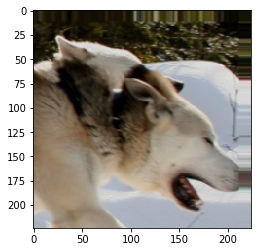

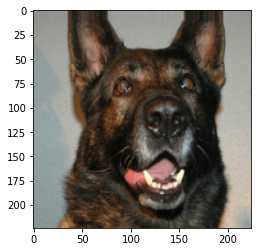

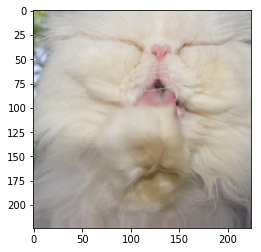

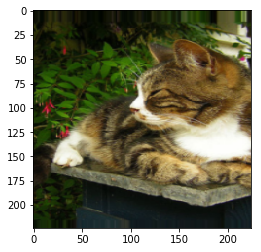

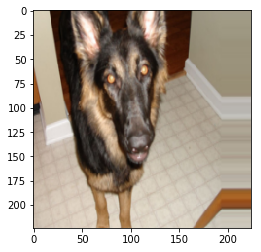

...

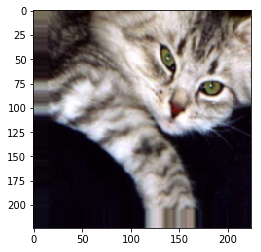

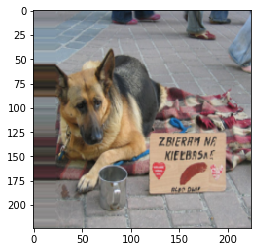

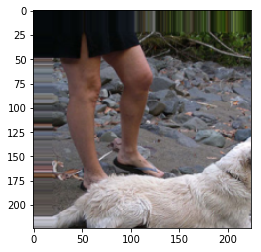

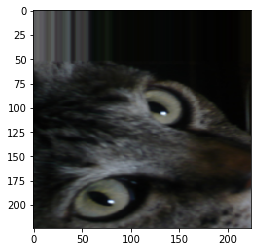

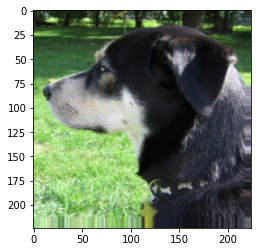

In [31]:
%matplotlib inline

for batch in train_generator:
    for i in range(batch[0].shape[0]):
        plt.figure(i)
        imgplot = plt.imshow(batch[0][i])
    break  # otherwise the generator would loop indefinitely
plt.show()

The next Cell defines parameters we use for training our networks and defines functions which we will use later to print our results.

In [32]:
def predict(idx, model, avg=None, transform = lambda x : x/255., cols=3, file=DATAFILE, data=None, threshold=.4):
    try:
        idx = list(idx)
    except:
        idx = [idx]
        
    cats = 0
    dogs = 0
    if data is None:
        with np.load(file) as datafile:
            data = datafile["data"][idx]
    else:
        data = data[idx]
    
    if transform is None:
        transform = lambda x : x
    p = model.predict(transform(data))
    i = 0
    while i < p.shape[0]:
        fig, axs = plt.subplots(1,cols,figsize=(8*cols,8))
        fig.figsize=(20,10)
        for ax in axs:
            if avg is not None:
                img = (data[i]+avg)
            else:
                img = (data[i])

            ax.imshow(img)
            if p[i] < threshold:
                label = "cat"
                cats += 1
            elif p[i] > 1-threshold:
                label = "dog"
                dogs += 1
            else:
                label = "not sure"
            ax.text(.5,0, label+ "; score = " + str(p[i]),
                    horizontalalignment='center', verticalalignment='bottom', transform=ax.axes.transAxes,
                    backgroundcolor="white", size="large")
            i += 1
            if i >= p.shape[0]:
                break
        plt.show()
    print(cats, " cats (", cats/len(idx)*100., "%),", dogs, " dogs (", dogs/len(idx)*100., "%)")
    
def predictCategorical(idx, model, decode=lambda x : str(x), preproc=lambda x : x/255.
                       , cols=3, file=DATAFILE, data=None):
    try:
        idx = list(idx)
    except:
        idx = [idx]
        
    if data is None:
        with np.load(file) as datafile:
            data = datafile["data"][idx]
    else:
        data = data[idx]
        
    p = model.predict(data if preproc is None else preproc(data))
    
    i=0
    while i < p.shape[0]:
        fig, axs = plt.subplots(1,cols,figsize=(8*cols,8))
        fig.figsize=(20,10)
        for ax in axs:
            ax.imshow(data[i])
            ax.text(.5,0, decode(p[i:i+1]),
                    horizontalalignment='center', verticalalignment='bottom', transform=ax.axes.transAxes,
                    backgroundcolor="white", size="large")
            i += 1
            if i >= p.shape[0]:
                break
        plt.show()

### A Rather Simple Network

Next, we define an train a rather simple network to tell cats from dogs. We used this one before on the CIFAR 10 data and it got us to about 80% accuracy there.

In [33]:
model = Sequential()
model.add(MaxPooling2D(pool_size=(2, 2), input_shape=input_shape))
model.add(Conv2D(48, kernel_size=(5, 5),
                 activation='relu', padding="same"))
model.add(Conv2D(32, (5, 5), activation='relu', padding="same"))
model.add(Conv2D(32, (3, 3), activation='relu', padding="same"))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())
model.add(Conv2D(96, (5, 5), activation='relu', padding="same"))
model.add(Conv2D(64, (3, 3), activation='relu', padding="same"))
model.add(Conv2D(64, (3, 3), activation='relu', padding="same"))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())
model.add(Conv2D(160, (3, 3), activation='relu', padding="same"))
model.add(Conv2D(128, (3, 3), activation='relu', padding="same"))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())
model.add(Conv2D(256, (3, 3), activation='relu', padding="same"))
model.add(Flatten())
model.add(Dropout(.3))
model.add(Dense(512, activation='relu'))
model.add(Dropout(.5))
model.add(Dense(128, activation='relu'))
model.add(Dense(1))
model.add(Activation('sigmoid'))

opt = keras.optimizers.adam(lr=0.0001)

model.compile(loss='binary_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

# model.summary()

In [34]:
hist = model.fit_generator(
        train_generator,
        steps_per_epoch=4000 // batch_size,
        epochs=10,
        validation_data=(x_test, y_test))

# model.save_weights('weights.h5')
# model.load_weights('weights.h5')

Epoch 1/10
125/125 [==============================] - 48s 380ms/step - loss: 0.7412 - acc: 0.6092 - val_loss: 0.6363 - val_acc: 0.6311
Epoch 2/10
125/125 [==============================] - 46s 370ms/step - loss: 0.6378 - acc: 0.6416 - val_loss: 0.6592 - val_acc: 0.6526
Epoch 3/10
125/125 [==============================] - 46s 368ms/step - loss: 0.5936 - acc: 0.6856 - val_loss: 0.8799 - val_acc: 0.5688
Epoch 4/10
125/125 [==============================] - 47s 374ms/step - loss: 0.5766 - acc: 0.7058 - val_loss: 0.6664 - val_acc: 0.6633
Epoch 5/10
125/125 [==============================] - 46s 367ms/step - loss: 0.5572 - acc: 0.7271 - val_loss: 0.5570 - val_acc: 0.7264
Epoch 6/10
125/125 [==============================] - 46s 367ms/step - loss: 0.5274 - acc: 0.7346 - val_loss: 0.7424 - val_acc: 0.6633
Epoch 7/10
125/125 [==============================] - 46s 366ms/step - loss: 0.5096 - acc: 0.7505 - val_loss: 0.5090 - val_acc: 0.7540
Epoch 8/10
125/125 [==============================] - 4

After ten epochs we see a validation accuray a bit over 70% and a few more epoch may get this up to ~80% again.

Now, let us have a look at the results this network give on a few images and the corresponding predictions.

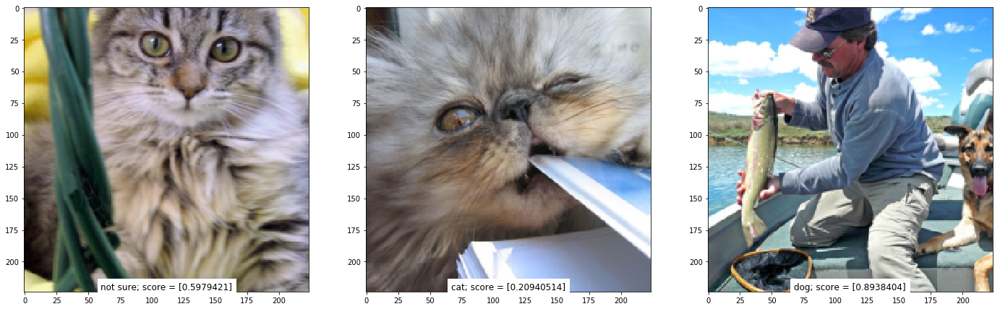

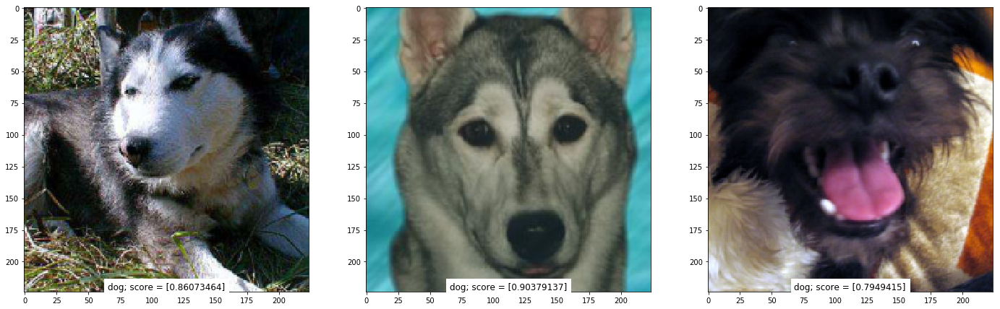

1  cats ( 16.666666666666664 %), 4  dogs ( 66.66666666666666 %)


In [35]:
# some arbitrary selection from the data
predict([1,2000,3000,4000,4300,4510], model)

This network is not very good, but decent, given, that some of the training images are rather complex.

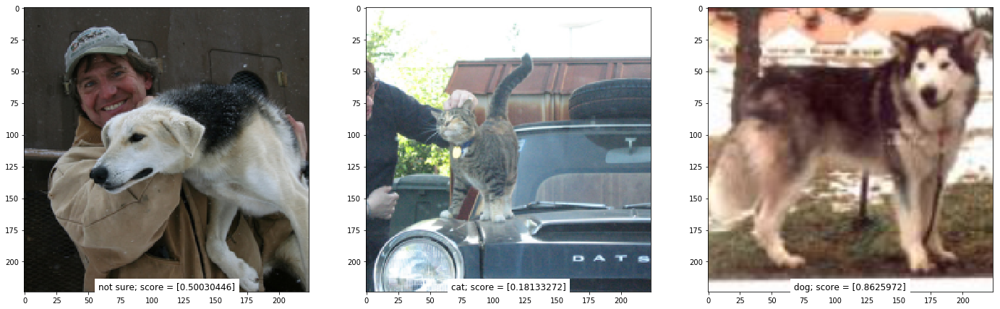

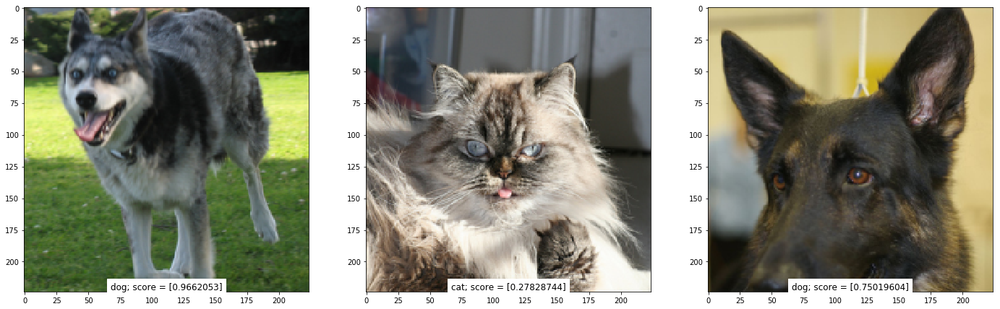

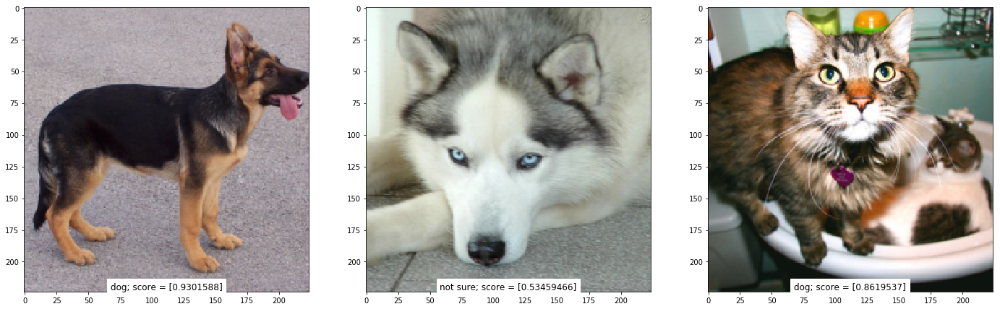

2  cats ( 22.22222222222222 %), 5  dogs ( 55.55555555555556 %)


In [36]:
# some of the training images
predict(range(9), model, data=x_train, transform=None)

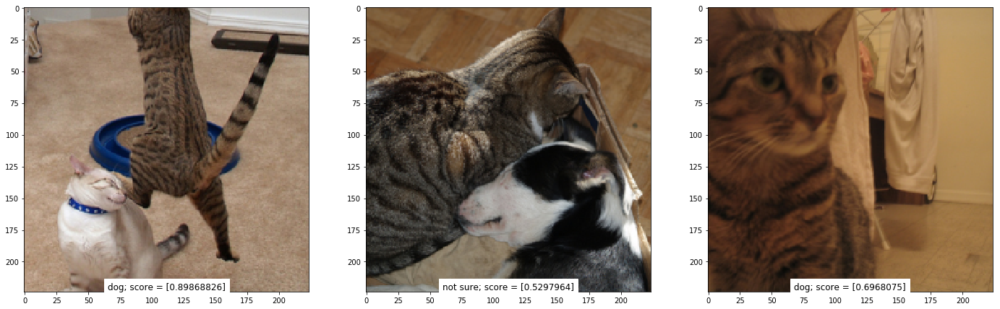

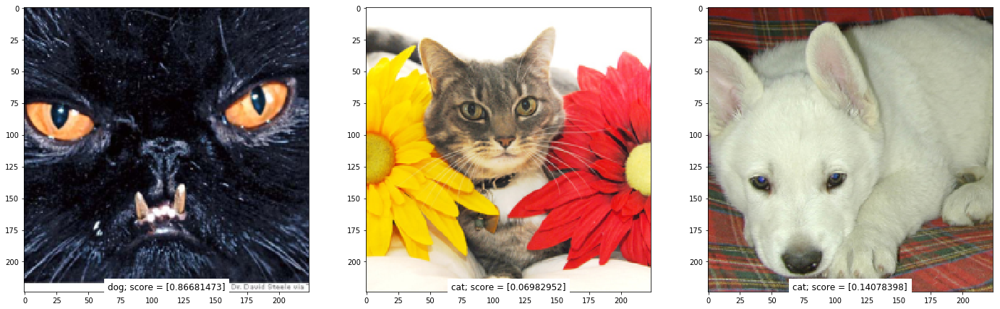

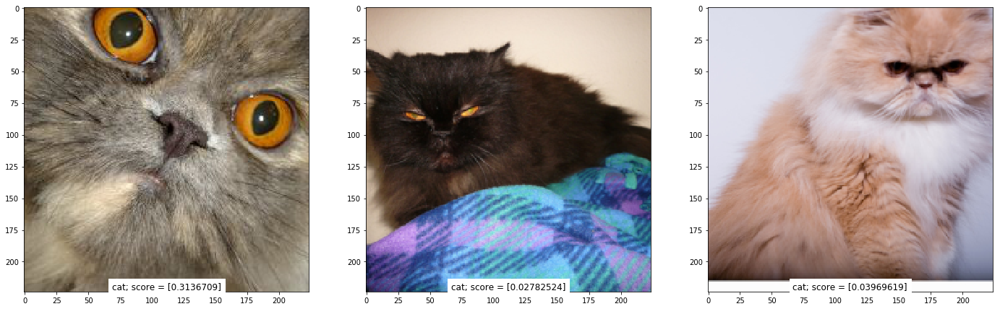

5  cats ( 55.55555555555556 %), 3  dogs ( 33.33333333333333 %)


In [37]:
# some of the validation images
predict(range(9), model, data=x_test, transform=None)

## Using a Pretrained Network

We will now try to use a pre-trained network for our purposes. The network we will try is the inception_v3 net trained on the ImageNet Dataset. This dataset contains images from 1000 categories.

In [38]:
from keras.applications import inception_v3, VGG16

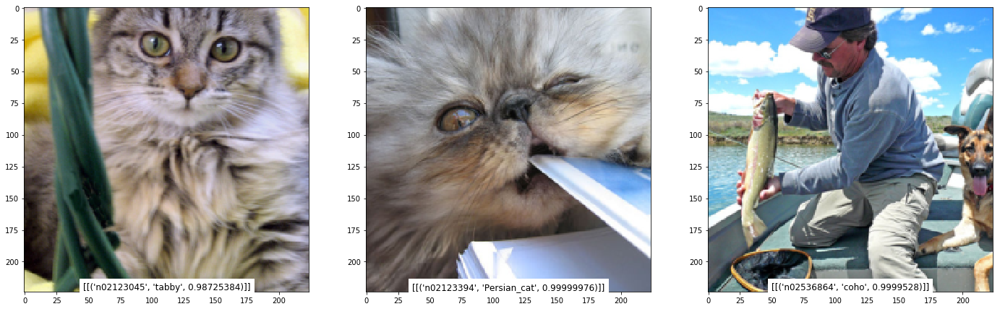

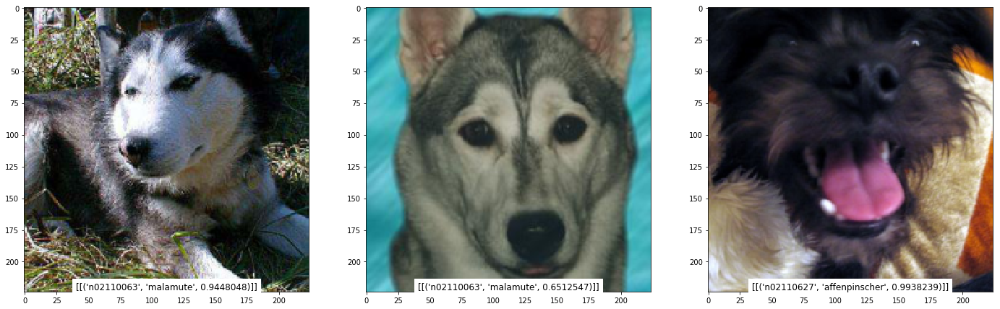

In [39]:
inception = inception_v3.InceptionV3()

predictCategorical([1,2000,3000,4000,4300,4510], model=inception, decode=lambda x: inception_v3.decode_predictions(x, top=1))

# Transfer Learning

Recent winners of the ImageNet competitions are very accurate. Can we change it to only do this and to also focus on cats and dogs only?

One way in which they are better than our small network is that they are able to generalize concepts better. The deep networks have learned to extract features from image which make up the things it knows. By replacing the top layer of the network by one we train ourselfes we can make use of the pre-trained network's ability to extract features to distinguish only the classes we want it to:

## Using Bottleneck Features

We will use the VGG16 architecture, pre-trained on the ImageNet dataset ---a model we will learn about later. Because the ImageNet dataset contains several "cat" classes (persian cat, siamese cat, ...) and many "dog" classes among its total of 1000 classes, this model will already have learned features that are relevant to our classification problem. In fact, it is possible that merely recording the softmax predictions of the model over our data rather than the bottleneck features would be enough to solve our dogs vs. cats classification problem extremely well. However, the method we present here is more likely to generalize well to a broader range of problems, including problems featuring classes absent from ImageNet.

Here's what the VGG16 architecture looks like:

![](../../images/vgg16_original.png)

Our strategy will be as follow: we will only instantiate the convolutional part of the model, everything up to the fully-connected layers. We will then run this model on our training and validation data once, recording the output (the "bottleneck features" from the VGG16 model: the last activation maps before the fully-connected layers) as numpy arrays. Then we will train a small fully-connected model on top of these stored features.

The reason why we are storing the features offline rather than adding our fully-connected model directly on top of a frozen convolutional base and running the whole thing, is computational efficiency. Running VGG16 is expensive, especially if you're working on CPU, and we want to only do it once. Note that this prevents us from using data augmentation though.

In [40]:
vgg16 = VGG16(include_top=False, weights='imagenet',input_shape=(224,224,3))

In [41]:
n = 2000 // batch_size

x_bottleneck_features_train = []
y_bottleneck_features_train = []
for i in train_generator:
    x_bottleneck_features_train.append(vgg16.predict(i[0]))
    y_bottleneck_features_train.append(i[1])
    n -= 1
    if n <= 0:
        break
x_bottleneck_features_train = np.concatenate(x_bottleneck_features_train)
y_bottleneck_features_train = np.concatenate(y_bottleneck_features_train)

x_bottleneck_features_test = vgg16.predict(x_test)

In [42]:
model = Sequential()
model.add(Flatten(input_shape=x_bottleneck_features_train.shape[1:]))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='rmsprop',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [45]:
model.fit(x_bottleneck_features_train, y_bottleneck_features_train,
          epochs=10,
          batch_size=batch_size,
          validation_data=(x_bottleneck_features_test, y_test))

Train on 1984 samples, validate on 1301 samples
Epoch 1/10
1984/1984 [==============================] - 1s 376us/step - loss: 0.1169 - acc: 0.9506 - val_loss: 0.2087 - val_acc: 0.9262
Epoch 2/10
1984/1984 [==============================] - 1s 366us/step - loss: 0.1090 - acc: 0.9607 - val_loss: 0.2733 - val_acc: 0.9193
Epoch 3/10
1984/1984 [==============================] - 1s 369us/step - loss: 0.1069 - acc: 0.9622 - val_loss: 0.9338 - val_acc: 0.7994
Epoch 4/10
1984/1984 [==============================] - 1s 384us/step - loss: 0.1284 - acc: 0.9516 - val_loss: 0.2216 - val_acc: 0.9331
Epoch 5/10
1984/1984 [==============================] - 1s 386us/step - loss: 0.0837 - acc: 0.9688 - val_loss: 0.2511 - val_acc: 0.9331
Epoch 6/10
1984/1984 [==============================] - 1s 381us/step - loss: 0.0749 - acc: 0.9688 - val_loss: 0.2997 - val_acc: 0.9270
Epoch 7/10
1984/1984 [==============================] - 1s 369us/step - loss: 0.0860 - acc: 0.9642 - val_loss: 0.2559 - val_acc: 0.9285


We reach a validation accuracy of 0.90-0.91: not bad at all. This is definitely partly due to the fact that the base model was trained on a dataset that already featured dogs and cats (among hundreds of other classes).

We also save the weights of this model as we will use it for our next method!

In [46]:
model.save_weights('bottleneck_fc_model.h5')

## Fine-tuning

To further improve our previous result, we can try to "fine-tune" the last convolutional block of the VGG16 model alongside the top-level classifier. Fine-tuning consist in starting from a trained network, then re-training it on a new dataset using very small weight updates. In our case, this can be done in 3 steps:

*  instantiate the convolutional base of VGG16 and load its weights
* add our previously defined fully-connected model on top, and load its weights
* freeze the layers of the VGG16 model up to the last convolutional block

![](../../images/vgg16_modified.png)

Note that:
* in order to perform fine-tuning, all layers should start with properly trained weights: for instance you should not slap a randomly initialized fully-connected network on top of a pre-trained convolutional base. This is because the large gradient updates triggered by the randomly initialized weights would wreck the learned weights in the convolutional base. In our case this is why we first train the top-level classifier, and only then start fine-tuning convolutional weights alongside it.
* we choose to only fine-tune the last convolutional block rather than the entire network in order to prevent overfitting, since the entire network would have a very large entropic capacity and thus a strong tendency to overfit. The features learned by low-level convolutional blocks are more general, less abstract than those found higher-up, so it is sensible to keep the first few blocks fixed (more general features) and only fine-tune the last one (more specialized features).
* fine-tuning should be done with a very slow learning rate, and typically with the SGD optimizer rather than an adaptative learning rate optimizer such as RMSProp. This is to make sure that the magnitude of the updates stays very small, so as not to wreck the previously learned features.

In [18]:
# was already done above if you ran all cells
# vgg16 = VGG16(include_top=False, weights='imagenet',input_shape=(224,224,3))

After instantiating the VGG base and loading its weights, we add our previously trained fully-connected classifier on top:

In [47]:
top_model = Sequential()
top_model.add(Flatten(input_shape=vgg16.output_shape[1:]))
top_model.add(Dense(256, activation='relu'))
top_model.add(Dropout(0.5))
top_model.add(Dense(1, activation='sigmoid'))

Now its necessary to start with a fully-trained classifier including the top classifier to do fine-tuning. Thus we now load the weights we saved in the bottleneck method:

In [48]:
top_model.load_weights('bottleneck_fc_model.h5')

Now we can add the model on top of the VGG16 convolutional base:

In [49]:
from keras.models import Model

model = Model(inputs=vgg16.input, 
              outputs=top_model(vgg16.output))

We then proceed to freeze all convolutional layers up to the last convolutional block:

In [50]:
# set the first 25 layers (up to the last conv block)
# to non-trainable (weights will not be updated)
for layer in model.layers[:15]:
    layer.trainable = False

In [51]:
from keras import optimizers

# compile the model with a SGD/momentum optimizer
# and a very slow learning rate.
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.SGD(lr=1e-4, momentum=0.9),
              metrics=['accuracy'])

Finally, we start training the whole thing, with a very slow learning rate:

In [52]:
# fine-tune the model
model.fit_generator(
    train_generator,
    steps_per_epoch=2000 // batch_size,
    epochs=10,
    validation_data=(x_test, y_test))

Epoch 1/10
62/62 [==============================] - 29s 471ms/step - loss: 0.3651 - acc: 0.8826 - val_loss: 0.1687 - val_acc: 0.9347
Epoch 2/10
62/62 [==============================] - 25s 404ms/step - loss: 0.2139 - acc: 0.9129 - val_loss: 0.1391 - val_acc: 0.9500
Epoch 3/10
62/62 [==============================] - 25s 405ms/step - loss: 0.2078 - acc: 0.9119 - val_loss: 0.1542 - val_acc: 0.9462
Epoch 4/10
62/62 [==============================] - 28s 444ms/step - loss: 0.1960 - acc: 0.9177 - val_loss: 0.1335 - val_acc: 0.9539
Epoch 5/10
62/62 [==============================] - 25s 406ms/step - loss: 0.1731 - acc: 0.9309 - val_loss: 0.1100 - val_acc: 0.9631
Epoch 6/10
62/62 [==============================] - 25s 408ms/step - loss: 0.1564 - acc: 0.9405 - val_loss: 0.1175 - val_acc: 0.9585
Epoch 7/10
62/62 [==============================] - 27s 434ms/step - loss: 0.1418 - acc: 0.9490 - val_loss: 0.1083 - val_acc: 0.9623
Epoch 8/10
62/62 [==============================] - 25s 403ms/step - 

This approach gets us to a validation accuracy of 0.94 after 10 epochs. Great success!

Here are a few more approaches you can try to get to above 0.95:
* more aggresive data augmentation
* more aggressive dropout
* use of L1 and L2 regularization (also known as "weight decay")
* fine-tuning one more convolutional block (alongside greater regularization)

## Outlook: Inception V3

We can also do the same thing with a more recend ImageNet winner: inception V3, which it actually the one we looked at for these first classifications.

For variety, we will only replace the top layer of this network by a single dense layer with one output (cat/dog). For brevity, we will not pre-calculate bootleneck features, but just freeze the whole network. This has the advantage that we can train on the whole augmented dataset.

In [60]:
# get the pre-trained inception_v3 network without its top layer
inception = inception_v3.InceptionV3(include_top=False
        , weights='imagenet', input_tensor=None, input_shape=input_shape, pooling=None)

# keep the pre-trained layers constant during training
for l in inception.layers:
    l.trainable = False
    
# add our own top
x = Flatten()(inception.output)
predictions=Dense(1, activation='sigmoid')(x)
modelInception = Model(outputs=predictions, inputs=inception.input)

modelInception.compile(optimizer='rmsprop',
              loss='binary_crossentropy',
              metrics=['accuracy'])


# modelInception.summary()

This model won the 2016 challenge. We will look at it, too, in more detail in a later session.

In [61]:
# train without augmentation, this shows more gradual improvement
modelInception.fit(x_train, y_train
                             , batch_size=batch_size
                             , validation_data=[x_test, y_test]
                             , epochs=8)

Train on 3035 samples, validate on 1301 samples
Epoch 1/8
3035/3035 [==============================] - 20s 7ms/step - loss: 1.1627 - acc: 0.8488 - val_loss: 0.2340 - val_acc: 0.9769
Epoch 2/8
3035/3035 [==============================] - 14s 5ms/step - loss: 0.4355 - acc: 0.9292 - val_loss: 0.0904 - val_acc: 0.9892
Epoch 3/8
3035/3035 [==============================] - 14s 5ms/step - loss: 0.3526 - acc: 0.9377 - val_loss: 0.4883 - val_acc: 0.9500
Epoch 4/8
3035/3035 [==============================] - 14s 5ms/step - loss: 0.1860 - acc: 0.9657 - val_loss: 0.0936 - val_acc: 0.9908
Epoch 5/8
3035/3035 [==============================] - 14s 5ms/step - loss: 0.1685 - acc: 0.9710 - val_loss: 0.0861 - val_acc: 0.9931
Epoch 6/8
3035/3035 [==============================] - 14s 5ms/step - loss: 0.2044 - acc: 0.9674 - val_loss: 0.1271 - val_acc: 0.9900
Epoch 7/8
3035/3035 [==============================] - 14s 5ms/step - loss: 0.1835 - acc: 0.9694 - val_loss: 0.0980 - val_acc: 0.9908
Epoch 8/8
3035

This model gives us ~98% accuracy after only 10 epochs and not much work.

Above we trained without data augmentation just on our bare traning data. With augmentation, the validation accuracy ends up at 99% after a few epochs, value where we might consider our test dataset too small to give us an accurate measurement. The traing accuracy remains smaller, probably because of the

In [62]:
# consider resetting the model above
modelInception.fit_generator(train_generator
                             , steps_per_epoch=2000 // batch_size
                             , validation_data=[x_test, y_test]
                             , epochs=2)

Epoch 1/2
62/62 [==============================] - 27s 441ms/step - loss: 0.4089 - acc: 0.9354 - val_loss: 0.0967 - val_acc: 0.9892
Epoch 2/2
62/62 [==============================] - 24s 386ms/step - loss: 0.3090 - acc: 0.9501 - val_loss: 0.0847 - val_acc: 0.9939


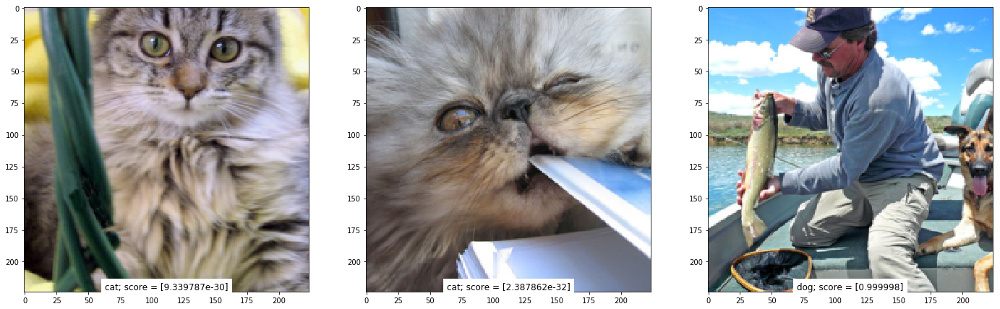

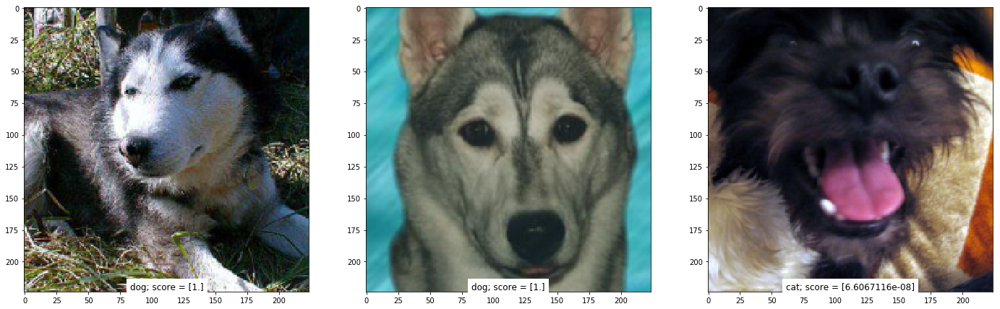

3  cats ( 50.0 %), 3  dogs ( 50.0 %)


In [63]:
# some arbitrary selection from the data
predict([1,2000,3000,4000,4300,4510], modelInception)

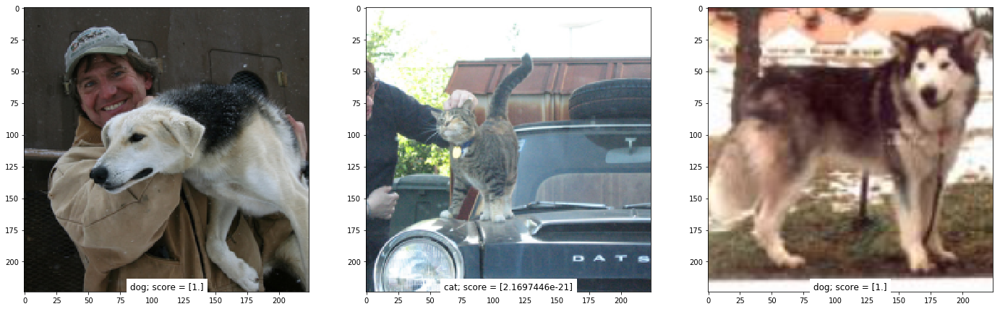

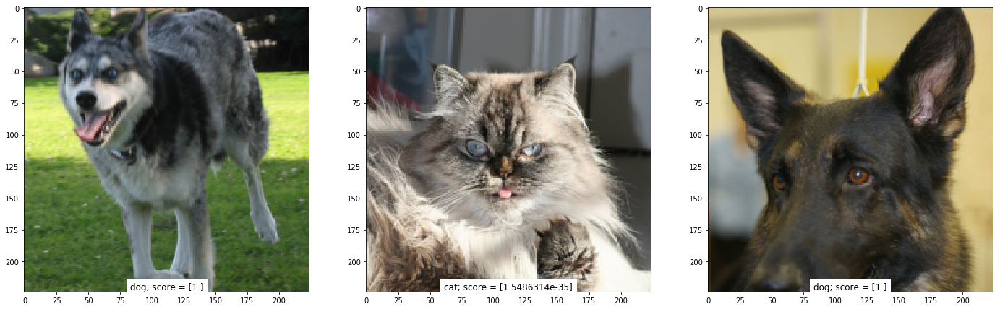

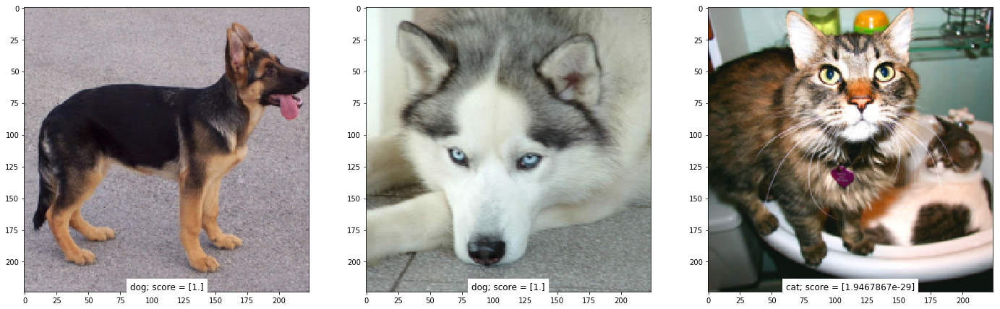

3  cats ( 33.33333333333333 %), 6  dogs ( 66.66666666666666 %)


In [64]:
# some of the training images
predict(range(9), modelInception, data=x_train, transform=None)

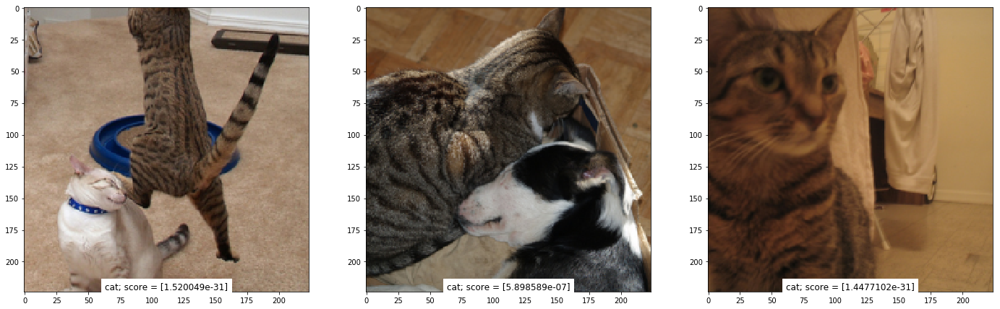

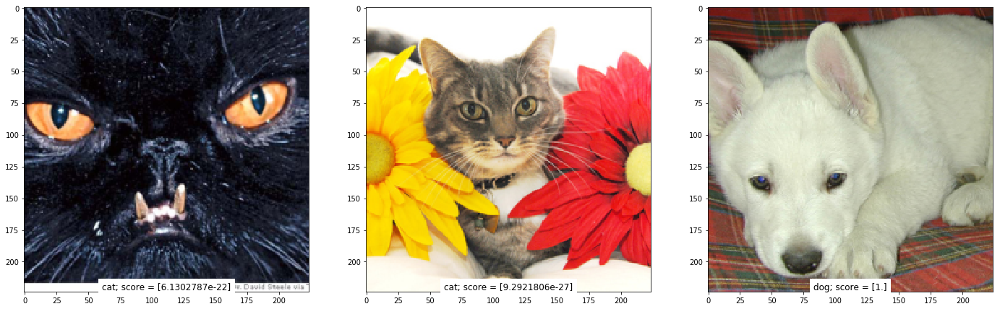

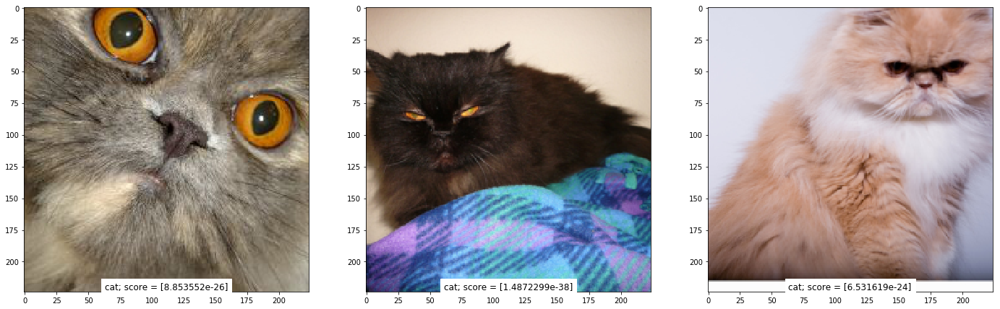

8  cats ( 88.88888888888889 %), 1  dogs ( 11.11111111111111 %)


In [65]:
# some of the validation images
predict(range(9), modelInception, data=x_test, transform=None)

### Databias

When preparing our dataset we did not include all dog-pictures. In fact, we happened to include only pictures of shepherds and huskies, while another breed was left. See how the inception-based model views these now:

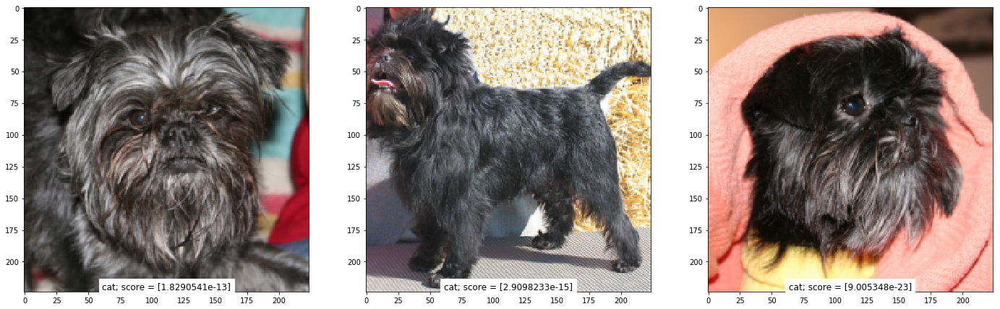

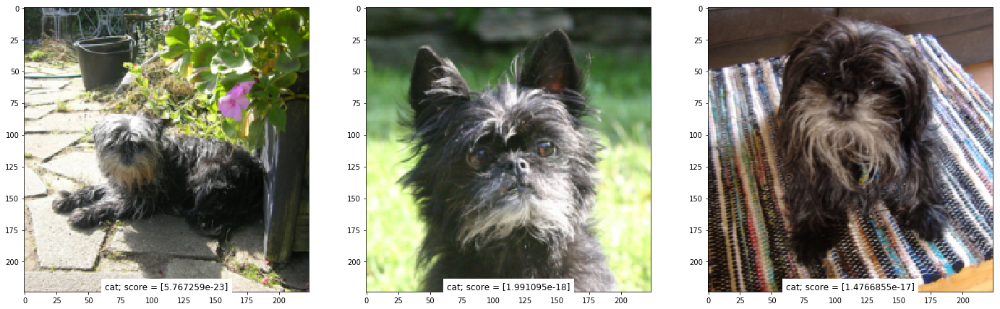

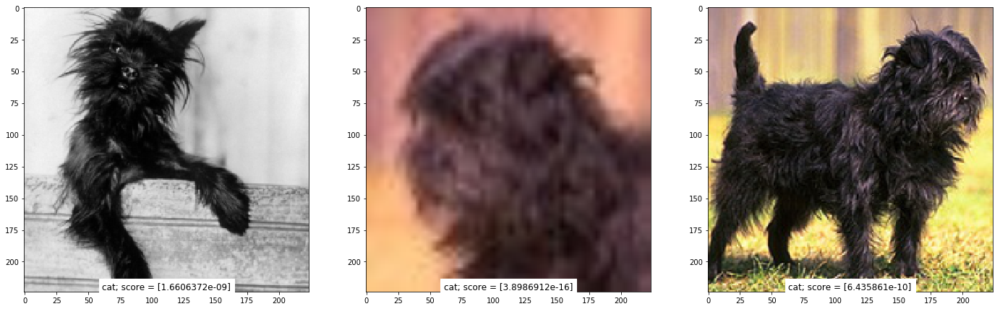

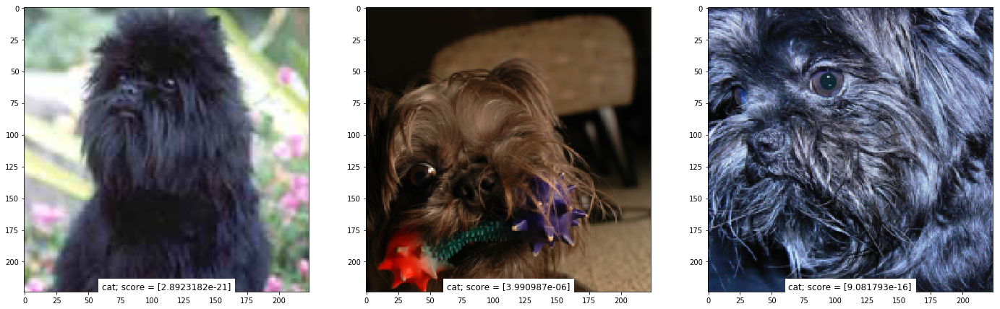

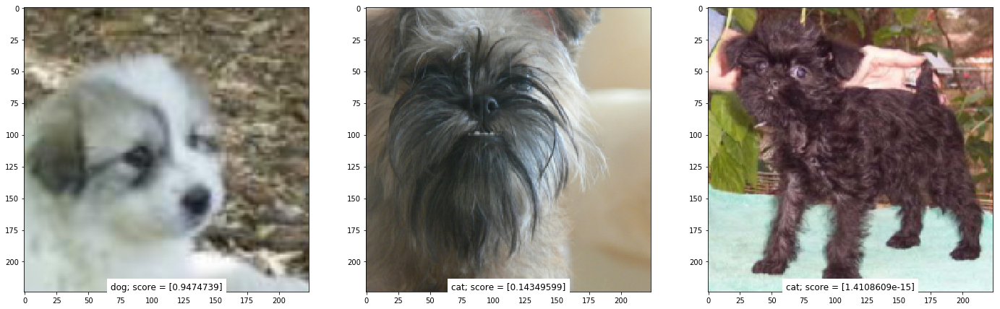

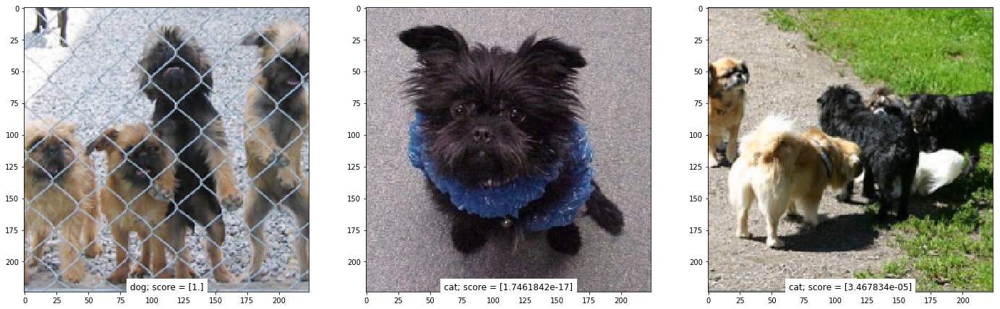

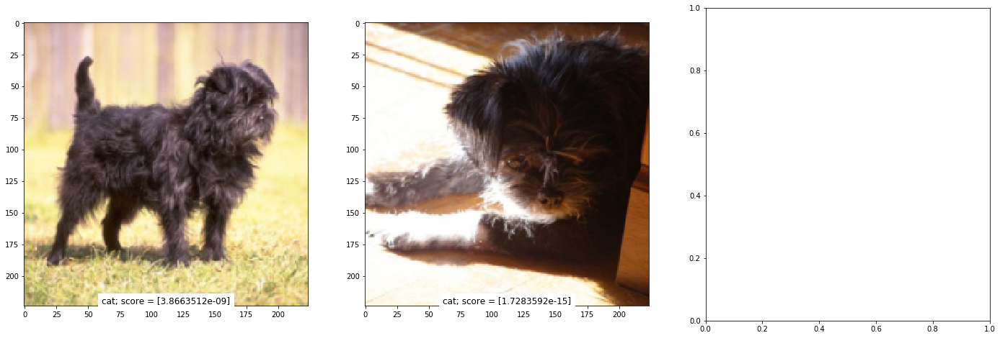

18  cats ( 90.0 %), 2  dogs ( 10.0 %)


In [66]:
predict(range(4400, 4420), modelInception)

Let us tune the model a bit with a more diverse dataset.

Here we can also see another way to feed images into keras: directly from directories:

## Another Cats-Dogs Dataset

We will start from a setup of only 2000 training examples (1000 per class either a dog or a cat). The data is stored in the `data/cats-dogs` folder which has a `train` data directory and a `validation` data directory containing one subdirectory per image class, filled with `.jpg` images:

```
cats-dogs/
    train/
        dogs/
            dog.001.jpg
            dog.002.jpg
            ...
        cats/
            cat.001.jpg
            cat.002.jpg
            ...
    validation/
        dogs/
            dog.003.jpg
            dog.004.jpg
            ...
        cats/
            cat.003.jpg
            cat.004.jpg
            ...
```

The `validataion` set consists of 400 additional samples from each class as validation data, to evaluate our models.

Note that `2000` samples are *very* few examples to learn from, for a classification problem that is far from simple. So this is a challenging machine learning problem, but it is also a realistic one: in a lot of real-world use cases, even small-scale data collection can be extremely expensive or sometimes near-impossible (e.g. in medical imaging). Being able to make the most out of very little data is a key skill of a competent data scientist.

In [71]:
import os
base_dir = os.path.join('..','..','data','cats-dogs')
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

train_cats_dir = os.path.join(train_dir, 'cats')
train_dogs_dir = os.path.join(train_dir, 'dogs')

validation_cats_dir = os.path.join(validation_dir, 'cats')
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

The following generator wil read the images from this directory tree and also normalize and augment them.

In [72]:
# prepare data augmentation configuration
train_datagen2 = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen2 = ImageDataGenerator(rescale=1. / 255)

train_generator2 = train_datagen2.flow_from_directory(
        train_dir,  # this is the target directory
        target_size=(224, 224),  # all images will be resized to 224x224
        batch_size=batch_size,
        class_mode='binary')  # since we use binary_crossentropy loss, we need binary labels

test_generator2 = test_datagen2.flow_from_directory(
    validation_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 800 images belonging to 2 classes.


In [73]:
# consider resetting the model above
modelInception.fit_generator(train_generator2
                             , steps_per_epoch=2000 // batch_size
                             , validation_data=test_generator2
                             , validation_steps=800 // batch_size
                             , epochs=5)

Epoch 1/5
62/62 [==============================] - 39s 623ms/step - loss: 0.8722 - acc: 0.8886 - val_loss: 0.2872 - val_acc: 0.9663
Epoch 2/5
62/62 [==============================] - 38s 609ms/step - loss: 0.5969 - acc: 0.9168 - val_loss: 0.1761 - val_acc: 0.9800
Epoch 3/5
62/62 [==============================] - 37s 605ms/step - loss: 0.4077 - acc: 0.9365 - val_loss: 0.1148 - val_acc: 0.9875
Epoch 4/5
62/62 [==============================] - 37s 591ms/step - loss: 0.4932 - acc: 0.9309 - val_loss: 0.4603 - val_acc: 0.9487
Epoch 5/5
62/62 [==============================] - 37s 594ms/step - loss: 0.3863 - acc: 0.9476 - val_loss: 0.2671 - val_acc: 0.9738


Now, we can have another look at that misunderstood breed:

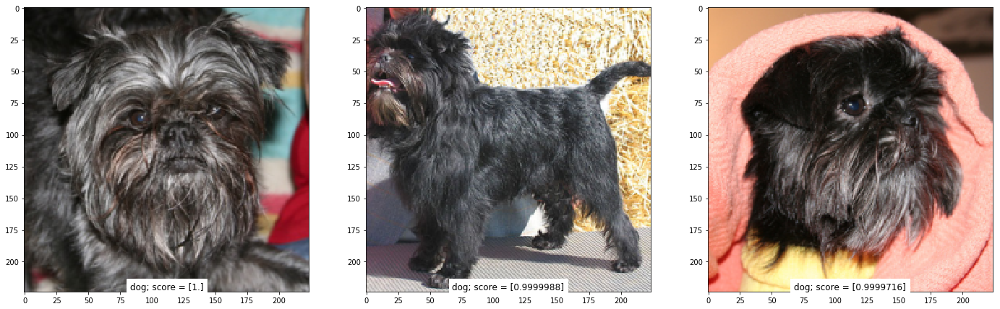

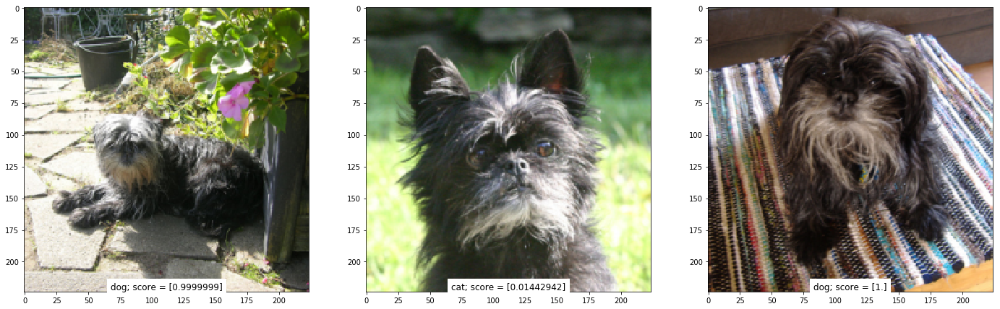

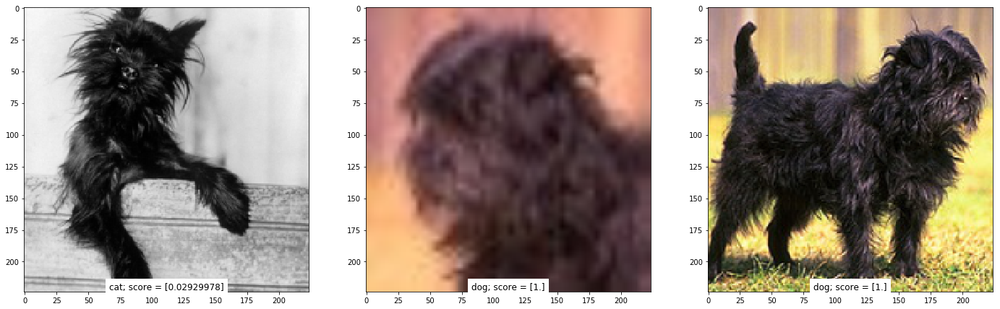

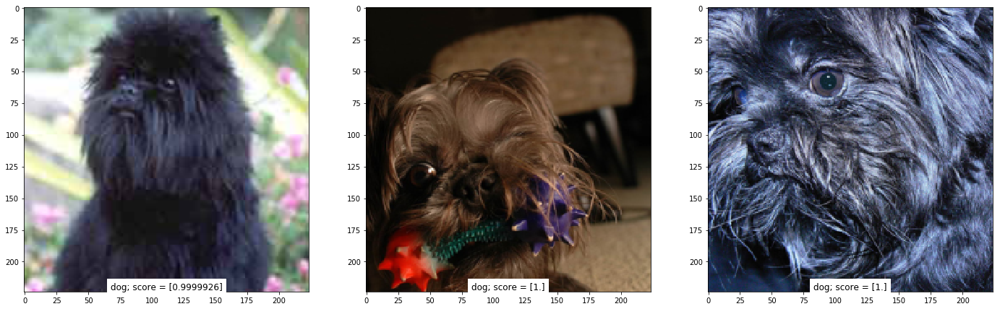

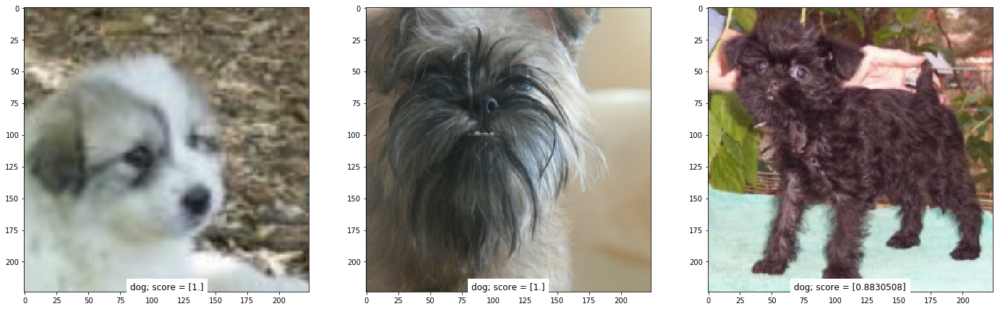

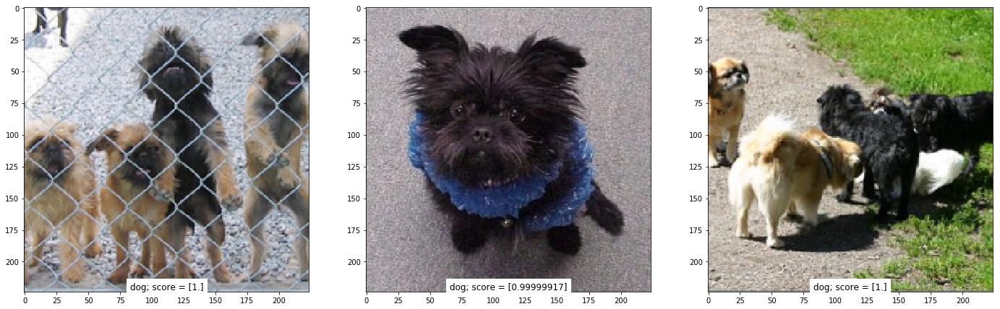

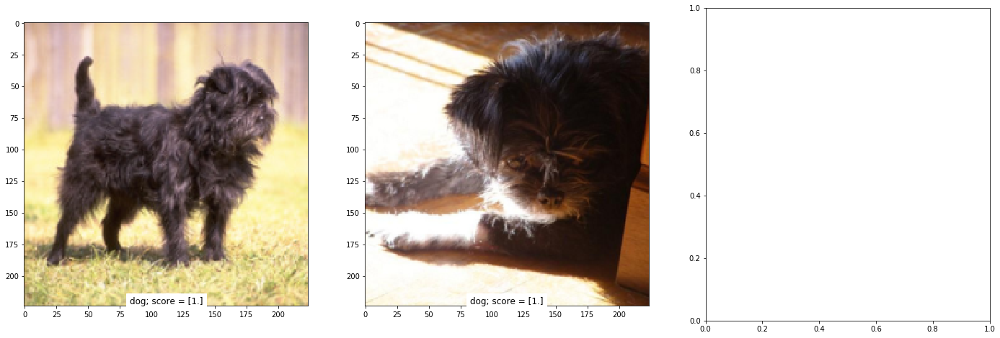

2  cats ( 10.0 %), 18  dogs ( 90.0 %)


In [74]:
predict(range(4400, 4420), modelInception)